In [1]:
#Import the necessary libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geojson
import folium
import webbrowser

In [2]:
#Read the .csv files and store them in dataframes.
listings_data_short = pd.read_csv("Data/Listings_short/listings_Sept_2023.csv")
calendar_data = pd.read_csv("Data/Calendar/calendar_Sept_2023.csv", parse_dates=True)
neighborhoods_data = pd.read_csv("Data/Neighborhoods/neighbourhoods_Sept_2023.csv")
reviews_data_short = pd.read_csv("Data/Reviews_short/reviews_Sept_2023.csv")

### Question 1
#### Neighbourhood Listings in Descending Order
Show the listings per neighbourghood, with the most popular neighbourhoods first (that is, in decreasing neighbourhood popularity order).

In [3]:
#Return the listings' neighbourhoods and their counts in the dataframe in descending order.
listings_data_short.neighbourhood.value_counts()

neighbourhood
ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ              2416
ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ                 1122
ΝΕΟΣ ΚΟΣΜΟΣ                          980
ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ             979
ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ     817
ΠΛΑΤΕΙΑ ΑΤΤΙΚΗΣ                      583
ΠΑΓΚΡΑΤΙ                             511
ΑΜΠΕΛΟΚΗΠΟΙ                          452
ΚΟΛΩΝΑΚΙ                             425
ΑΚΡΟΠΟΛΗ                             386
ΘΗΣΕΙΟ                               386
ΠΕΤΡΑΛΩΝΑ                            352
ΚΕΡΑΜΕΙΚΟΣ                           343
ΚΥΨΕΛΗ                               271
ΣΤΑΔΙΟ                               252
ΓΟΥΔΙ                                230
ΙΛΙΣΙΑ                               216
ΠΛΑΤΕΙΑ ΑΜΕΡΙΚΗΣ                     180
ΝΙΡΒΑΝΑ                              174
ΠΑΤΗΣΙΑ                              166
ΛΥΚΑΒΗΤΤΟΣ                           162
ΖΑΠΠΕΙΟ                              161
ΑΝΩ ΚΥΨΕΛΗ                           119
ΓΚΥΖΗ                                118
ΠΕ

### Question 2
#### Neighbourhood Prices in Descending Order

Create a table with the prices per neighbourhood. The prices information should contain:

* median price per neighbourhood

* mean price per neighbourhood

* standard deviation per neighbourhood

* number of listings per neighbourhood.

The contents of the table should be in descending median prices.

In [4]:
#Create pandas dataframe.
prices_df = pd.DataFrame()
#Insert a Neighbourhood column with all neighbourhoods into the dataframe.
prices_df['Neighbourhood'] = pd.Series(listings_data_short.neighbourhood.unique()).sort_values().values
#Insert a Median column with all median prices based on neighbourhoods into the dataframe.
prices_df['Median'] = pd.Series(listings_data_short.groupby(['neighbourhood'])['price'].median()).values
#Insert a Mean column with all mean prices based on neighbourhoods into the dataframe.
prices_df['Mean'] = pd.Series(listings_data_short.groupby(['neighbourhood'])['price'].mean()).values
#Insert a Standard deviation column with all standard deviations of prices based on neighbourhoods into the dataframe.
prices_df['Standard deviation'] = pd.Series(listings_data_short.groupby(['neighbourhood'])['price'].std()).values
#Insert a Listings number column with the number of listings based on neighbourhoods into the dataframe.
prices_df['Listings number'] = pd.Series(listings_data_short.neighbourhood.value_counts().sort_index()).values
#Sort the records of the dataframe by their Median column value on descending order.
prices_df = prices_df.sort_values(by=['Median'], ascending=False).reset_index(drop=True)
#Show the dataframe.
prices_df

,Neighbourhood,Median,Mean,Standard deviation,Listings number
0,ΡΗΓΙΛΛΗΣ,120.0,367.800000,578.622675,5
1,ΖΑΠΠΕΙΟ,114.0,224.068323,641.163173,161
2,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,104.0,140.650662,229.183015,2416
3,ΑΚΡΟΠΟΛΗ,100.0,195.344560,703.321565,386
4,ΚΟΛΩΝΑΚΙ,100.0,128.595294,104.431349,425
5,ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ,90.5,120.284314,104.613533,1122
6,ΘΗΣΕΙΟ,90.0,126.492228,124.176775,386
7,ΚΕΡΑΜΕΙΚΟΣ,89.0,123.883382,136.367487,343
8,ΛΥΚΑΒΗΤΤΟΣ,75.0,104.561728,87.859850,162
9,ΓΚΑΖΙ,70.5,95.792453,75.355882,106


### Question 3
#### Availability per Day
Create a plot with the number of listings available per day, on the $y$ axis, and the date, on the $x$ axis.

In [5]:
#Convert the values of the 'available' column to string and use a dictionary to convert them to boolean values.
calendar_data['available'] = calendar_data['available'].astype(str).map({ 't': True, 'f': False, True: True, False: False })
#Convert the values of the 'date' column to date time.
calendar_data['date'] = pd.to_datetime(calendar_data['date'])

<Axes: title={'center': 'Availability per Day'}, xlabel='Date', ylabel='Available AirBnBs'>

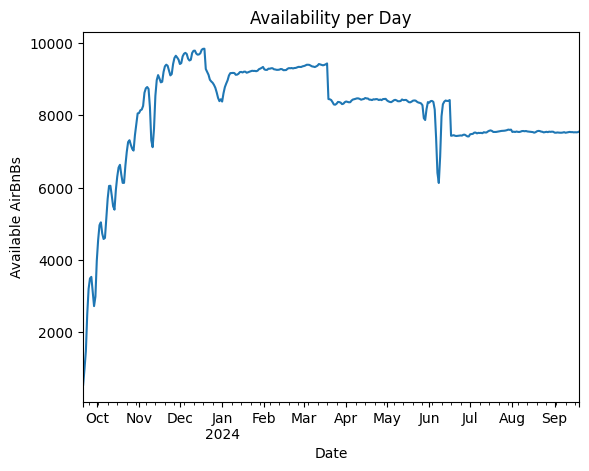

In [6]:
#Count the number of listings where the value of the 'available' column is True, grouped by each day.
available_counts = calendar_data.groupby('date')['available'].sum()
#Plot the above count
available_counts.plot( title='Availability per Day', xlabel='Date', ylabel='Available AirBnBs')

### Question 4
#### Reviews, Occupacy per Listing, Average Income

Create a histogram showing the number of reviews per listing. The histogram should bin the number of reviews, from the smallest amount of reviews in a listing, to the maximum number of reviews in a listing rounded up to the closeshundredg..

review_counts
100              8998
200              1172
300               517
400               179
500                86
600                32
700                 8
800                 5
900                 2
Name: count, dtype: int64


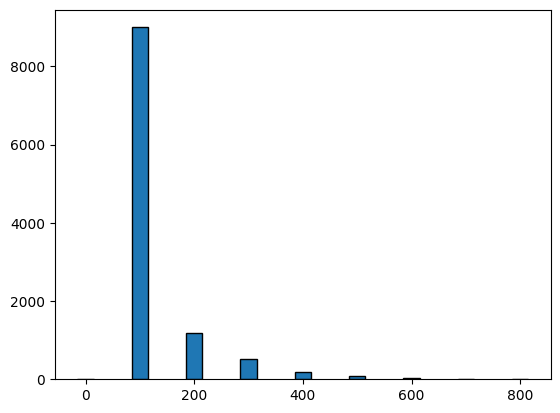

In [7]:
#Create pandas dataframe.
review_counts = pd.DataFrame()
#Insert a listing_id column with all listing ids' review counts into the dataframe.
review_counts = reviews_data_short['listing_id'].value_counts().to_frame('review_counts')
#Round all review count values up to the closest hundred.
review_counts = (review_counts / 100).apply(np.ceil).astype(int) *100
#Reset the index of the dataframe.
review_counts.reset_index( drop=True, inplace=True)
#Print the value counts of the pandas dataframe.
print(review_counts.value_counts())
#PLot the question histogram.
_=plt.hist(review_counts, edgecolor='black', bins=[0,100,200,300,400,500,600,700,800,900], align='left', rwidth=0.3)

In [8]:
#Create pandas dataframe.
average_occupacy = pd.DataFrame()
#Insert a date column in the dataframe grouped by month with the count of reviews per month.
average_occupacy = reviews_data_short.groupby(pd.PeriodIndex(reviews_data_short['date'], freq="M")).count()
#Drop the index column.
average_occupacy.drop('date', axis='columns', inplace=True)
#Reset the index.
average_occupacy.reset_index( inplace=True)
#Rename the columns for aesthetic purposes.
average_occupacy.rename( columns={"date": "Year-Month", "listing_id": "Number of Reviews"}, inplace=True)
#Divide the total number of review per month with number of unique listings to find the review count average per listing.
average_occupacy['Number of Reviews per Listing'] = average_occupacy['Number of Reviews']/reviews_data_short['listing_id'].nunique()
#Create a pandas dataframe column with the number of bookings.
#The average occupancy is defined by the number of reviews multiplied by 2 and then multiplied by 3.
average_occupacy['Number of Bookings'] = average_occupacy['Number of Reviews per Listing']*2
#(Assuming the mean occupation duration is 3 nights).
average_occupacy['Average Occupacy'] = average_occupacy['Number of Bookings']*3
#Print pandas dataframe.
average_occupacy[['Year-Month','Number of Bookings','Average Occupacy']]

,Year-Month,Number of Bookings,Average Occupacy
0,2010-07,0.000182,0.000546
1,2010-11,0.000182,0.000546
2,2011-05,0.000182,0.000546
3,2011-06,0.000182,0.000546
4,2011-07,0.000364,0.001091
...,...,...,...
146,2023-05,3.826712,11.480135
147,2023-06,4.136012,12.408037
148,2023-07,4.107101,12.321302
149,2023-08,3.796891,11.390672


In [9]:
#Calculate the mean price of all listings in the listing data dataframe.
average_price = listings_data_short['price'].mean()
#Calculate the Average Income per Month column by multiplying the Number of Bookings column with the mean price of all listings.
average_occupacy['Average Income per Month'] = average_occupacy['Average Occupacy']*average_price
#Print pandas dataframe.
average_occupacy[['Year-Month','Average Income per Month']]

,Year-Month,Average Income per Month
0,2010-07,0.060256
1,2010-11,0.060256
2,2011-05,0.060256
3,2011-06,0.060256
4,2011-07,0.120511
...,...,...
146,2023-05,1268.079447
147,2023-06,1370.574250
148,2023-07,1360.993607
149,2023-08,1258.197526


### Question 5
#### Listings per Room Type

Show the number of listings per room type, in absolute numbers, and also in percentages (the percentage of listings for each particular room type). Then, show the number of listings per neighrbourhood and room type.

In [10]:
#Create pandas dataframe.
room_types=pd.DataFrame()
#Insert a Number of Rooms column in the dataframe with the count of rooms based on room type.
room_types.insert(0,'Number of Rooms',listings_data_short['room_type'].value_counts())
#Insert a Percentage of Rooms column in the dataframe with the percentage of rooms based on room type.
room_types.insert(1,'Percentage of Rooms',listings_data_short['room_type'].value_counts(normalize=True))
#Rename the index to Room Type.
room_types.index.names=['Room Type']
#Print pandas dataframe. 
print(room_types)
print('\n\n\n')
#Create pandas dataframe.
neighborhood_room_types=pd.DataFrame()
#Calculate the number of listings per room type, per neighbourhood.
neighborhood_room_types=listings_data_short.groupby(['neighbourhood','room_type'])['neighbourhood'].count()
#Print pandas dataframe.
print(neighborhood_room_types)

                 Number of Rooms  Percentage of Rooms
Room Type                                            
Entire home/apt            11652             0.899421
Private room                1113             0.085913
Hotel room                   105             0.008105
Shared room                   85             0.006561




neighbourhood                     room_type      
1Ο ΝΕΚΡΟΤΑΦΕΙΟ                    Entire home/apt     55
ΑΓΙΟΣ ΕΛΕΥΘΕΡΙΟΣ                  Entire home/apt     33
                                  Private room         5
ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ  Entire home/apt    686
                                  Hotel room           4
                                                    ... 
ΣΤΑΔΙΟ                            Private room        11
ΣΤΑΘΜΟΣ ΛΑΡΙΣΗΣ                   Entire home/apt     73
                                  Hotel room           4
                                  Private room         4
                                  Shared room       

### Question 6
#### Prices per Day

Create a table with the average price per listing per day. Draw a graph visualizing the table.

<Axes: title={'center': 'Average Price per Day'}, xlabel='Date', ylabel='Price per Day'>

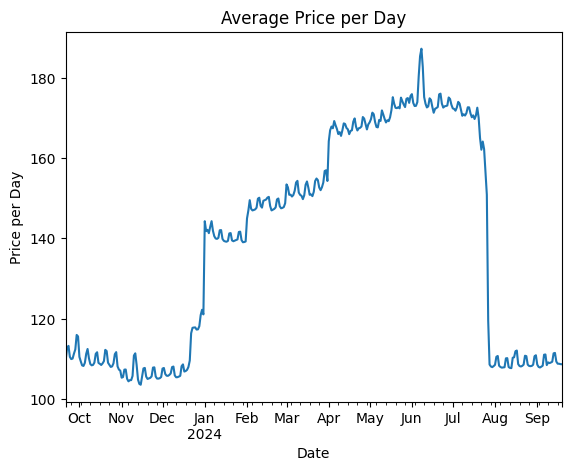

In [11]:
#Create pandas dataframe.
listing_prices=pd.DataFrame()
#Create an ID column in the dataframe identical the listing_id column in the calendar data dataframe.
listing_prices['ID']=calendar_data['listing_id']
#Create a Price per Day column in the dataframe based on the adjusted_price column in the calendar data dataframe.
#The adjusted_price column is first trimmed and processed to be parsed into integers. This is necessary to calculate the mean value.
listing_prices['Price per Day']=calendar_data['adjusted_price'].str.slice(1).str.removesuffix('.00').str.replace(',','.').str.replace('.','').astype('int')
#Create a Date column in the dataframe identical the date column in the calendar data dataframe and convert it to date time.
listing_prices['Date']=pd.to_datetime(calendar_data['date'])
#PLot the graph of the question.
listing_prices.groupby(['Date'])['Price per Day'].mean().plot(title='Average Price per Day', xlabel='Date', ylabel='Price per Day')

### Question 7
#### Listings per Host

Create a table with the number of listings per host, in descending order. Create a graph that will show the distribution of listings per host, as follows:

* You will rank the host on a number of listings basis. So, the first host will be the one with the largest number of listings, the second host will be the one with the second largest number of listings, etc. If there is a number of hosts with the same listings, just add them in sequence. For instance, if there are 10 hosts with one listing each, add them in the ranking with any order between them.

* On the $y$ axis you will have the number of listings.

That is, a point $(x, y)$ will mean that the $x$-th highest hosting host has $y$ listings.

After you have drawn the plot, do another one, this time with the $x$ axis in *logarithmic* scale.

<Axes: title={'center': 'Host Ranks'}, xlabel='Rank (logarithmic scale)', ylabel='Number of Listings'>

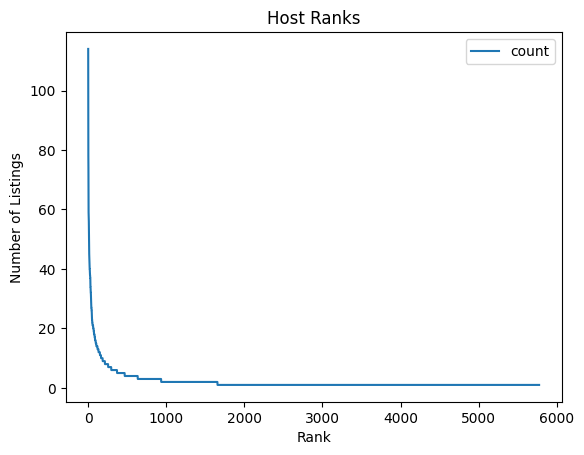

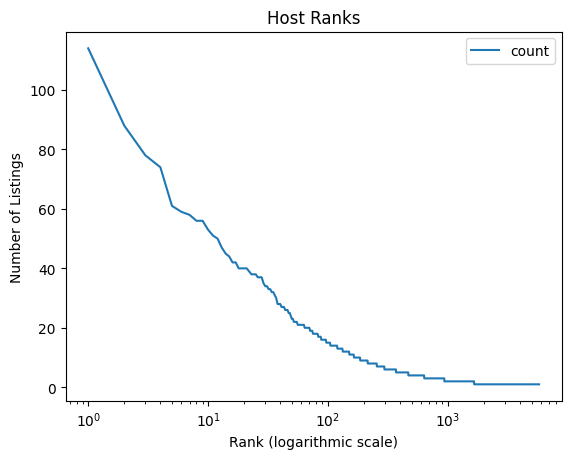

In [12]:
#Create pandas dataframe.
host_ranks=pd.DataFrame()
#Create a host_id column in the dataframe by counting the number of listings per host id.
host_ranks=listings_data_short['host_id'].value_counts().reset_index()
#Drop the dataframe index.
host_ranks.drop('host_id', axis='columns', inplace=True)
#Reset the dataframe index.
host_ranks.reset_index(drop=True, inplace=True)
#Add +1 to the dataframe index to convert it to a Rank index.
host_ranks.index+= 1
#PLot the graph of the question.
host_ranks.plot(title='Host Ranks', xlabel='Rank', ylabel='Number of Listings')
#PLot the graph of the question in logarithmic scale.
host_ranks.plot(title='Host Ranks', xlabel='Rank (logarithmic scale)', ylabel='Number of Listings', logx=True)

### Question 8
#### Visualize Listings

Draw an interactive map to show the listings ovelayed on Athens.

You can use the [folium](https://github.com/python-visualization/folium) library to create your map; spend some time reading the documentation.

The map should show each listing and on clicking on top of it, the user should see a short description of the listing.

Note that such a map is heavy on resources. You will probably *not* be able to include it in a Jupyter notebook, so you should save it to an external HTML file that can be opened by any browser. Also, to make things easier, you make wish to limit the maximum zoom level from 12 to 15 (after you read folium's documentation you will know what this is).

Hint: be careful with the description data, if they contain some characters they may not be rendered in HTML and may destroy your output.

In [13]:
#Create a folium map centered and zoomed at the location of Athens.
Athens_map = folium.Map(location=(37.9838,23.7275), zoom_start=12, max_zoom=15, min_zoom=10)
#Add the GeoJson neighbourhood data of Athens to the folium map.
folium.GeoJson('Data/neighbourhoods_Sept_2023.geojson').add_to(Athens_map)
#Create pandas dataframe.
listings_coordinates=pd.DataFrame(columns=['Description','Latitude','Longtitude'])
#Insert the name column values of the listings data into the Description column.
listings_coordinates['Description']=listings_data_short['name']
#Insert the latitude column values of the listings data into the Latitude column.
listings_coordinates['Latitude']=listings_data_short['latitude']
#Insert the longitude column values of the listings data into the Longtitude column.
listings_coordinates['Longtitude']=listings_data_short['longitude'].sort_values()
#Add circle markers to the folium map based on the coordinates of the dataframe.
#Each circle marker is created with the description of the Description column value.
#Each circle marker is created with the Longtitude/Latitude of the Longtitude/Latitude columns' values.
listings_coordinates.apply(lambda row:folium.CircleMarker(location=[row["Latitude"], row["Longtitude"]], 
                           radius=0.8, color='blue', popup=row['Description']).add_to(Athens_map), axis=1)
#Save the folium map to an html file.
Athens_map.save('AthensAirBnB.html')
#Uncomment below line to display the html file on a new browser tab.
    #webbrowser.open_new_tab('AthensAirBnB.html')
#Uncomment below line to display the folium map.
    #Athens_map